In [106]:
from matplotlib import pyplot as plt
import numpy as np
from sklearn.svm import SVR, LinearSVR
import sklearn.linear_model as linear_model
from sklearn.externals import joblib
import helita.sim.bifrost as br

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

In [52]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score
import sys
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [4]:
import kmeans as kmeans

In [6]:
dd=br.BifrostData('l2d90x40r_it',fdir='/net/opal/Volumes/Amnesia/mpi3drun/2Druns/genohm/rain/l2d90x40r/') 
#dd=br.BifrostData('l2d90x40r_it’)
tg=dd.get_varTime('tg',snap=range(200,200+157),iiy=0,iix=range(0,6930,2))
z=dd.z
r=dd.get_varTime('r',snap=range(200,200+157),iiy=0,iix=range(0,6930,2))

(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var):

(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  tg
(get_var): reading simple  (6930, 1, 1554)
(get_var):

(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(get_var): reading simple  (6930, 1, 1554)
(get_var): reading  r
(ge

In [7]:
kmo = kmeans.kmeans()
kmo.read_data_ncdf(rbfilename='/net/opal/Volumes/Amnesia/mpi3drun/2Druns/genohm/rain/output_ray_l2d90x40r.ncdf')
kmo.read_lim_interp(rbfilename='/net/opal/Volumes/Amnesia/mpi3drun/2Druns/genohm/rain/output_ray_l2d90x40r.ncdf', ind=5)

True
True
new_inte1 5 (3465, 157, 1280)


In [19]:
mins = np.zeros((len(kmo.new_inte1[5]), len(kmo.new_inte1[5][0])))
for i in range(len(mins)):
    for j in range(len(mins[0])):
        mins[i,j] = np.min(kmo.new_inte1[5][i,j,:])

In [20]:
mins.shape

(3465, 157)

In [21]:
mins[0, :]

array([5.80572325e-09, 3.78878710e-09, 4.05334594e-09, 7.40928423e-09,
       8.57712474e-09, 6.38815028e-09, 3.87695209e-09, 3.14230265e-09,
       3.01817122e-09, 2.68301949e-09, 2.44564255e-09, 3.86993172e-09,
       4.59326433e-09, 4.09746766e-09, 4.55798706e-09, 3.27081811e-09,
       2.76547051e-09, 3.55993976e-09, 5.27107516e-09, 4.57267220e-09,
       4.75192908e-09, 4.81715955e-09, 4.00349749e-09, 3.13600726e-09,
       3.53628868e-09, 2.04048434e-09, 1.27952133e-09, 1.16809618e-09,
       1.60274340e-09, 5.29683764e-09, 8.30230465e-09, 1.15311126e-08,
       1.61157088e-08, 1.74633267e-08, 1.57678862e-08, 1.47116556e-08,
       7.33060536e-09, 6.62557368e-09, 9.57504070e-09, 1.26578260e-08,
       1.26193999e-08, 9.17487441e-09, 6.24988747e-09, 7.98980810e-09,
       8.63860751e-09, 5.85088714e-09, 7.31667348e-09, 6.88954823e-09,
       4.10683289e-09, 5.98858066e-09, 8.65615626e-09, 7.31242249e-09,
       6.19050380e-09, 1.40326959e-08, 5.95633645e-09, 5.77108159e-09,
      

In [22]:
smallmins = np.zeros(len(kmo.new_inte1[5]))
for i in range(len(smallmins)):
    smallmins[i]=np.min(mins[i,:])

In [23]:
smallmins.shape

(3465,)

In [24]:
print(tg)

[[[[1838382.875      1753975.25       1792213.75       ...
    1589480.75       1605533.875      1612842.625     ]
   [1840996.375      1756093.875      1793333.25       ...
    1578728.375      1597145.125      1604146.25      ]
   [1844557.375      1760743.75       1799549.5        ...
    1565825.625      1587846.5        1595191.5       ]
   ...
   [  22397.24023438   22313.64453125   22308.484375   ...
      22278.74023438   22278.7421875    22278.75390625]
   [  22634.703125     22534.98242188   22536.04101562 ...
      22515.03320312   22515.03320312   22513.59375   ]
   [  22715.2421875    22715.25195312   22715.25195312 ...
      22715.49023438   22715.4921875    22715.4921875 ]]]


 [[[1839497.875      1755433.         1792816.875      ...
    1584755.25       1600745.         1608002.        ]
   [1842122.75       1757695.125      1793917.5        ...
    1574157.125      1592465.375      1599426.125     ]
   [1845659.         1762406.375      1800193.625      ...
    156137

In [25]:
tg.shape

(3465, 1, 1554, 157)

In [26]:
r.shape

(3465, 1, 1554, 157)

In [33]:
temp_reshape = np.reshape(np.transpose(tg.reshape((6930,1554)),(0,1)),(6930,1554))

ValueError: cannot reshape array of size 845383770 into shape (6930,1554)

In [34]:
np.shape(np.reshape(np.transpose(tg.reshape((6930,1554)),(0,1)),(6930,1554)))

ValueError: cannot reshape array of size 845383770 into shape (6930,1554)

In [35]:
temp_reshape.shape

NameError: name 'temp_reshape' is not defined

In [36]:
temp_train = temp_reshape[0:3600, :]
temp_test = temp_reshape[3600:, :]

NameError: name 'temp_reshape' is not defined

In [37]:
plt.imshow(temp_reshape, aspect='auto')

NameError: name 'temp_reshape' is not defined

In [38]:
clf = linear_model.LassoLarsCV()
#clf = LinearSVR()
#clf = linear_model.SGDRegressor()
#clf = linear_model.Lars()

In [39]:
mebbex = np.zeros((10769220, 1))

In [40]:
for i in range(len(mebbex)):
    mebbex[i] = i

In [41]:
print(mebbex)

[[0.0000000e+00]
 [1.0000000e+00]
 [2.0000000e+00]
 ...
 [1.0769217e+07]
 [1.0769218e+07]
 [1.0769219e+07]]


In [42]:
mebbex = mebbex.reshape(6930, 1554)

In [43]:
temp_train_reshape = temp_train.reshape(temp_train.shape[0] * temp_train.shape[1])

NameError: name 'temp_train' is not defined

In [44]:
temp_train_reshape.shape

NameError: name 'temp_train_reshape' is not defined

In [45]:
mebbex.shape

(6930, 1554)

In [46]:
clf.fit(mebbex[0:5594400],temp_train_reshape)

NameError: name 'temp_train_reshape' is not defined

In [47]:
predictT = clf.predict(mebbex[5594400:])

NotFittedError: This LassoLarsCV instance is not fitted yet. Call 'fit' with appropriate arguments before using this method.

In [48]:
predictT.shape

NameError: name 'predictT' is not defined

In [49]:
predictT_reshape = predictT.reshape(3330, 1554)

NameError: name 'predictT' is not defined

In [50]:
plt.imshow(predictT_reshape, aspect='auto')

NameError: name 'predictT_reshape' is not defined

In [51]:
plt.plot(clf.predict(mebbex[0:3465].reshape(3600, 1554)))

ValueError: cannot reshape array of size 5384610 into shape (3600,1554)

In [52]:
clf.fit(temp_reshape[0:3465, :], smallmins)

NameError: name 'temp_reshape' is not defined

In [37]:
temp_reshape[0:3465, :].shape

(3465, 1554)

In [38]:
temp_reshape

memmap([[1838382.9  , 1840996.4  , 1844557.4  , ...,   22397.24 ,
           22634.703,   22715.242],
        [1838940.4  , 1841560.2  , 1845109.2  , ...,   22397.371,
           22635.908,   22715.242],
        [1839497.9  , 1842122.8  , 1845659.   , ...,   22397.494,
           22637.12 ,   22715.242],
        ...,
        [1836707.   , 1839308.   , 1842898.4  , ...,   22398.523,
           22633.338,   22715.242],
        [1837265.8  , 1839868.9  , 1843453.5  , ...,   22397.084,
           22633.164,   22715.242],
        [1837827.4  , 1840434.5  , 1844003.5  , ...,   22397.168,
           22633.932,   22715.242]], dtype=float32)

In [39]:
smallmins

array([0., 0., 0., ..., 0., 0., 0.])

In [46]:
for i in range(len(smallmins)):
    print(smallmins[i], end=" ")

1.080836328945776e-09 1.1137326583686355e-09 1.1195901133047507e-09 1.2890989368433639e-09 1.4209267964705068e-09 1.4493572102548606e-09 1.4658609127711517e-09 1.392718028506641e-09 1.3589098360766728e-09 1.343619100100901e-09 1.4113513594541482e-09 1.3040406868070888e-09 1.1956871893096472e-09 1.1876218453426955e-09 1.2927877069398461e-09 1.293893794384499e-09 1.2819804456098577e-09 1.2903305546128368e-09 1.274872111576078e-09 1.2098450229108664e-09 1.2209149215169267e-09 1.2692540473317174e-09 1.1835331549410829e-09 1.148689333150119e-09 1.24080248822328e-09 1.4421740722282876e-09 1.8541641230375155e-09 1.8036215360846312e-09 1.937379470557151e-09 1.7411971719967552e-09 1.5059476494968575e-09 1.4845867763449522e-09 2.006823987905298e-09 2.2640449021327527e-09 2.2478357516837343e-09 1.9133776802965416e-09 1.6405179468221882e-09 1.4064402870459286e-09 1.4032299365281222e-09 1.8419790817167105e-09 1.883115003170538e-09 1.9328018668981166e-09 1.860836323624366e-09 1.737797803399912e-09 1

 1.634607455562376e-09 1.6841220788722647e-09 1.5742409785085207e-09 1.5003650972836511e-09 1.433693595072865e-09 1.3884141713379003e-09 1.3846946297193397e-09 1.343004096236645e-09 1.3481360804027503e-09 1.3328760333159602e-09 1.317392736215699e-09 1.2676150746642326e-09 1.2231786390130255e-09 1.1999684545584566e-09 1.2080623229304216e-09 1.2301679081483166e-09 1.232988757667298e-09 1.2733957161492182e-09 1.196638973716134e-09 1.137743186226329e-09 1.1038487188274832e-09 1.0608801390605139e-09 1.0141786515883269e-09 9.400056385447744e-10 8.991207314907583e-10 8.853521073018912e-10 8.774697695439707e-10 8.917036795610677e-10 9.185621576268712e-10 9.364133563779876e-10 9.511081722988513e-10 9.134500693348325e-10 8.623990942914386e-10 8.569118060333102e-10 8.726938280008173e-10 9.665833834331072e-10 1.0423304962593776e-09 1.0302289350531817e-09 1.1803099075297838e-09 1.2829671532532785e-09 1.1895555048672519e-09 1.3530128782873998e-09 1.2499135183594744e-09 9.92856613214487e-10 1.0492509

In [42]:
for i in range(len(mins)):
    for j in range(len(mins[0])):
        print(mins[i][j], end=" ")
    print()

1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.080836328945776e-09 1.08083632

1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.2903305546128368e-09 1.290330554

2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.006823987905298e-09 2.00682398

1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.2919568706406432e-09 1.291956870

1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.0573298370575713e-09 1.057329837

6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.590673998886979e-10 6.59067399

6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.523075417751785e-10 6.52307541

8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.169488081841839e-10 8.16948808

1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.0248437429265012e-09 1.024843742

9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.736761515046187e-10 9.73676151

1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.1070849634163161e-09 1.107084963

7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.871020877108009e-10 7.87102087

9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.325444509791529e-10 9.32544450

7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.807876130232287e-10 7.80787613

5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.966380220375634e-10 5.96638022

7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.180827296806474e-10 7.18082729

6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919014e-10 6.00036856919

5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.208284038305418e-10 5.20828403

7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.798566627351242e-10 7.79856662

7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.963442583234692e-10 7.96344258

7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.558533208934921e-10 7.55853320

5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.586894229163962e-10 5.58689422

7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.692737334659546e-10 7.69273733

9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.622470860799749e-10 9.62247086

8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.515637332641707e-10 8.51563733

6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.398137275133453e-10 6.39813727

7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.674430751342172e-10 7.67443075

1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.0015892339867464e-09 1.001589233

9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.663932219990256e-10 9.66393221

9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.683241954554442e-10 9.68324195

1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.0535867157190032e-09 1.053586715

1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.685315014681845e-09 1.68531501

1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.2990515388437841e-09 1.299051538

1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.410218397723728e-09 1.41021839

9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.375013324932426e-10 9.37501332

1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.5591669780548768e-09 1.559166978

1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.4026964710862787e-09 1.402696471

6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.424762941433585e-10 6.42476294

8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.928368945361429e-10 8.92836894

6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.404151529421486e-10 6.40415152

9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.379404109686338e-10 9.37940410

1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.1461852732781242e-09 1.146185273

7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.795924186631334e-10 7.79592418

1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.8283364171330008e-09 1.828336417

1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.1917911547964203e-09 1.191791154

1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.166454768868912e-09 1.16645476

9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.442490648147645e-10 9.44249064

7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.599060946804237e-10 7.59906094

9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.159974058724105e-10 9.15997405

5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.891729764589308e-10 5.89172976

6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635518e-10 6.49502870635

1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.0729530764815775e-09 1.072953076

6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.947910664654679e-10 6.94791066

9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.499798079960167e-10 9.49979807

8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596896e-10 8.20223406596

5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.729632801071637e-10 5.72963280

9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.535537284413204e-10 9.53553728

7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.729531585965501e-10 7.72953158

9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.450984286429755e-10 9.45098428

7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.774263783673792e-10 7.77426378

1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.109127623951593e-09 1.10912762

7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.622149830702188e-10 7.62214983

1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.0651104100720377e-09 1.065110410

8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.761024784722095e-10 8.76102478

1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.1967049331255297e-09 1.196704933

1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.411952057074814e-09 1.41195205

7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.466100608906794e-10 7.46610060

5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.157432670486193e-10 5.15743267

6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.223167560918213e-10 6.22316756

9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379438e-10 9.58534097379

7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.237685526007215e-10 7.23768552

8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.377503597082478e-10 8.37750359

1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.5423474839909253e-09 1.542347483

7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.377654895501674e-10 7.37765489

1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.6685980803972073e-09 1.668598080

1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.0669172388178187e-09 1.066917238

1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.3743301460669555e-09 1.374330146

1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207168e-09 1.12878889207

1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.0647006276083359e-09 1.064700627

1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.1469153569555022e-09 1.146915356

7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.860672367258491e-10 7.86067236

8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.032707450790346e-10 8.03270745

7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.816314761107819e-10 7.81631476

7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.960154514951272e-10 7.96015451

9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 9.0914181083928e-10 

1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.4202497977432884e-09 1.420249797

2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.1269320681416942e-09 2.126932068

8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.026490091355632e-10 8.02649009

1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.1293147732326616e-09 1.129314773

1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.1701417508231272e-09 1.170141750

1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.133475202475659e-09 1.13347520

1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.0632074207319016e-09 1.063207420

1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.2465747813080815e-09 1.246574781

1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.3805566109741322e-09 1.380556610

1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.6399777481711472e-09 1.639977748

5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.932109637067087e-10 5.93210963

5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.717158494385936e-10 5.71715849

5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.855879831217402e-10 5.85587983

5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.684768106548152e-10 5.68476810

4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144162e-10 4.51492685144

5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.024971421264997e-10 5.02497142

1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.2273635868824252e-09 1.227363586

2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.0250274447776936e-09 2.025027444

1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.4183474338581316e-09 1.418347433

1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.3913138363581928e-09 1.391313836

1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.310759326755642e-09 1.31075932

1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.0150693652146081e-09 1.015069365

7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.920263103304338e-10 7.92026310

7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.558175043396748e-10 7.55817504

4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.3849735180159407e-10 4.384973518

5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.061750666194016e-10 5.06175066

5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467865e-10 5.59164207467

4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.794785134157996e-10 4.79478513

8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.734417791704978e-10 8.73441779

1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.317015642671689e-09 1.31701564

1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.2185688279347577e-09 1.218568827

7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.723599771782384e-10 7.72359977

1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.5981020365454143e-09 1.598102036

1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839464e-09 1.34899124839

1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.3479413526041503e-09 1.347941352

1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.2743974015947698e-09 1.274397401

1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.0360949966077092e-09 1.036094996

9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043688e-10 9.09160154043

8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.859957225540979e-10 8.85995722

8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.130262034061959e-10 8.13026203

1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.239983666070774e-09 1.23998366

6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.395318511609183e-10 6.39531851

7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.548384753911702e-10 7.54838475

1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.488413380396596e-09 1.48841338

1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.196638973716134e-09 1.19663897

1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.0302289350531817e-09 1.030228935

1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183934e-09 1.11244078183

9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.791138460807336e-10 9.79113846

8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.053198817983633e-10 8.05319881

1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.2442351877111335e-09 1.244235187

8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.665403428480864e-10 8.66540342

1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.0857209465810162e-09 1.085720946

7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.305915844376825e-10 7.30591584

7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.549762265980733e-10 7.54976226

7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.933417509544084e-10 7.93341750

6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.624510564253472e-10 6.62451056

6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724103e-10 6.96550246724

7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.597390086575789e-10 7.59739008

1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.0318408479181391e-09 1.031840847

8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.798051822668308e-10 8.79805182

8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.471409336815005e-10 8.47140933

1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535082e-09 1.14990863535

7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.791050045907531e-10 7.79105004

7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.529612269183145e-10 7.52961226

6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.005092967004176e-10 6.00509296

7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.089881108773608e-10 7.08988110

9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.357777558695441e-10 9.35777755

1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.0456939397332122e-09 1.045693939

1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.086859682960471e-09 1.08685968

1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.0459661140884964e-09 1.045966114

9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.359871272158952e-10 9.35987127

1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.0718227211433376e-09 1.071822721

1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.3335890895123907e-09 1.333589089

1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.318043979647568e-09 1.31804397

7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.321716478746352e-10 7.32171647

5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.609626471462879e-10 5.60962647

5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517791e-10 5.87485119517

1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.0772308975015565e-09 1.077230897

8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.544153425918681e-10 8.54415342

KeyboardInterrupt: 

In [43]:
np.min(mins)

4.3849735180159407e-10

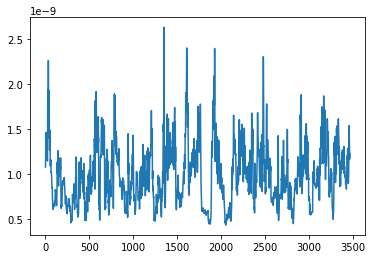

In [50]:
plt.plot(smallmins)

In [51]:
smallmins.shape

(3465,)

In [61]:
temp_reshape2 = temp_reshape.reshape((len(temp_reshape) * len(temp_reshape[0]), 1))

In [63]:
temp_reshape2.shape

(10769220, 1)

In [67]:
temp_reshape_small = temp_reshape[0:3465, :].reshape((int(len(temp_reshape)*len(temp_reshape[0])/2), 1))

In [68]:
temp_reshape_small.shape

(5384610, 1)

In [69]:
mins.shape

(3465, 157)

In [70]:
3465*157

544005

In [71]:
r

memmap([[[9.1144496e-09, 9.3343306e-09, 9.5334780e-09, ...,
          4.0914810e+02, 4.2227457e+02, 4.2680566e+02]],

        [[9.1210053e-09, 9.3408490e-09, 9.5400257e-09, ...,
          4.0914850e+02, 4.2223349e+02, 4.2680566e+02]],

        [[9.1275663e-09, 9.3473718e-09, 9.5465973e-09, ...,
          4.0914868e+02, 4.2219241e+02, 4.2680566e+02]],

        ...,

        [[9.0942365e-09, 9.3149799e-09, 9.5139869e-09, ...,
          4.0907242e+02, 4.2231686e+02, 4.2680566e+02]],

        [[9.1010559e-09, 9.3214139e-09, 9.5204493e-09, ...,
          4.0914243e+02, 4.2232874e+02, 4.2680566e+02]],

        [[9.1077412e-09, 9.3278700e-09, 9.5269517e-09, ...,
          4.0914536e+02, 4.2230176e+02, 4.2680566e+02]]], dtype=float32)

In [72]:
r.shape

(6930, 1, 1554)

In [53]:
mins.shape

(3465, 157)

In [129]:
tg_train = tg[:,:,:,0:100]
print(tg_train.shape)

(3465, 1, 1554, 100)


In [54]:
xstuff = np.reshape(np.transpose(tg,(0,1,3,2)),(3465*157,1554))

In [55]:
xstuff.shape

(544005, 1554)

In [56]:
3465*157

544005

In [57]:
tg.shape

(3465, 1, 1554, 157)

In [58]:
ystuff = np.reshape(mins, 3465*157)

In [59]:
ystuff.shape

(544005,)

In [76]:
clf1 = linear_model.LassoLarsCV()
clf2 = LinearSVR()
clf3 = linear_model.SGDRegressor()
clf4 = linear_model.Lars()

In [61]:
X_train = xstuff[0:272003, :]
Y_train = ystuff[0:272003]
X_test = xstuff[272003:, :]
Y_test = ystuff[272003:]

In [62]:
X_train.shape

(272003, 1554)

In [63]:
Y_train.shape

(272003,)

In [64]:
X_test.shape

(272002, 1554)

In [65]:
Y_test.shape

(272002,)

In [66]:
clf.fit(X_train, Y_train)

LinearSVR(C=1.0, dual=True, epsilon=0.0, fit_intercept=True,
     intercept_scaling=1.0, loss='epsilon_insensitive', max_iter=1000,
     random_state=None, tol=0.0001, verbose=0)

In [67]:
predicted = clf.predict(X_test)

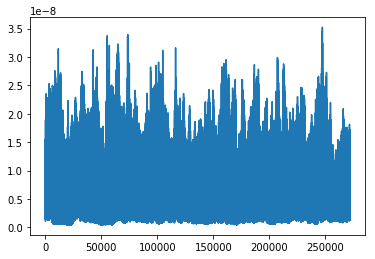

In [68]:
plt.plot(Y_test)

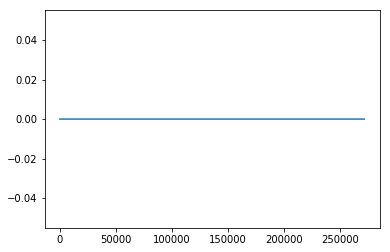

In [69]:
plt.plot(predicted)

In [70]:
predicted.shape

(272002,)

In [71]:
predicted

array([0., 0., 0., ..., 0., 0., 0.])

In [72]:
clf.predict(X_train)

array([0., 0., 0., ..., 0., 0., 0.])

In [73]:
Y_train

array([5.80572325e-09, 3.78878710e-09, 4.05334594e-09, ...,
       4.82968880e-09, 5.73537892e-09, 4.71260901e-09])

In [74]:
X_train

array([[1838382.875     , 1840996.375     , 1844557.375     , ...,
          22397.24023438,   22634.703125  ,   22715.2421875 ],
       [1753975.25      , 1756093.875     , 1760743.75      , ...,
          22313.64453125,   22534.98242188,   22715.25195312],
       [1792213.75      , 1793333.25      , 1799549.5       , ...,
          22308.484375  ,   22536.04101562,   22715.25195312],
       ...,
       [1614165.25      , 1614227.75      , 1614239.375     , ...,
          22283.03515625,   22523.4765625 ,   22715.48828125],
       [1602608.875     , 1603425.875     , 1604720.375     , ...,
          22283.00390625,   22523.48632812,   22715.4921875 ],
       [1580387.25      , 1581395.875     , 1583120.75      , ...,
          22279.38476562,   22522.10546875,   22715.49023438]])

In [75]:
X_test

array([[1560327.375     , 1560888.375     , 1561439.75      , ...,
          22278.33007812,   22520.18359375,   22715.4921875 ],
       [1573585.5       , 1574050.        , 1574340.75      , ...,
          22277.99414062,   22518.99609375,   22715.49023438],
       [1542778.375     , 1543042.375     , 1543423.875     , ...,
          22276.90039062,   22517.65234375,   22715.4921875 ],
       ...,
       [1594206.75      , 1583300.625     , 1570279.25      , ...,
          22274.0859375 ,   22509.61328125,   22715.49023438],
       [1610334.875     , 1601818.875     , 1592427.375     , ...,
          22274.0859375 ,   22509.61328125,   22715.4921875 ],
       [1617676.75      , 1608863.75      , 1599866.125     , ...,
          22274.0859375 ,   22509.6171875 ,   22715.4921875 ]])

In [77]:
clf3.fit(X_train, Y_train)

/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDRegressor'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


SGDRegressor(alpha=0.0001, average=False, epsilon=0.1, eta0=0.01,
       fit_intercept=True, l1_ratio=0.15, learning_rate='invscaling',
       loss='squared_loss', max_iter=None, n_iter=None, penalty='l2',
       power_t=0.25, random_state=None, shuffle=True, tol=None, verbose=0,
       warm_start=False)

In [91]:
predict3 = clf3.predict(X_test)

In [92]:
predict3.shape

(272002,)

In [93]:
predict3

array([6.67883638e+22, 6.95762793e+22, 7.59163703e+22, ...,
       1.32516071e+23, 1.30693864e+23, 1.26769109e+23])

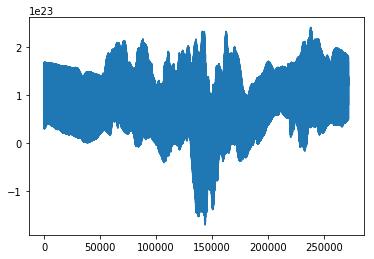

In [94]:
plt.plot(predict3)

In [82]:
clf4.fit(X_train,Y_train)

Lars(copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
   fit_path=True, n_nonzero_coefs=500, normalize=True, positive=False,
   precompute='auto', verbose=False)

In [86]:
predict4 = clf4.predict(X_test)

In [87]:
predict4

array([5.756658e-09, 5.756658e-09, 5.756658e-09, ..., 5.756658e-09,
       5.756658e-09, 5.756658e-09])

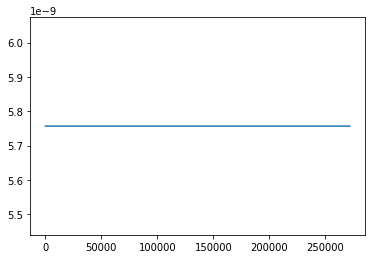

In [88]:
plt.plot(predict4)

In [89]:
clf3.predict(X_train)

array([1.13069327e+23, 1.11192950e+23, 1.18536046e+23, ...,
       8.04680263e+22, 7.05932690e+22, 5.56474989e+22])

In [90]:
Y_train

array([5.80572325e-09, 3.78878710e-09, 4.05334594e-09, ...,
       4.82968880e-09, 5.73537892e-09, 4.71260901e-09])

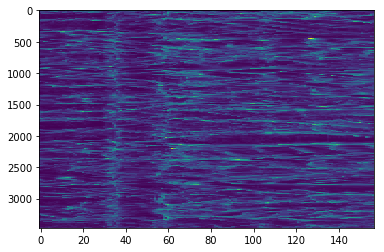

In [96]:
plt.imshow(mins, aspect='auto')

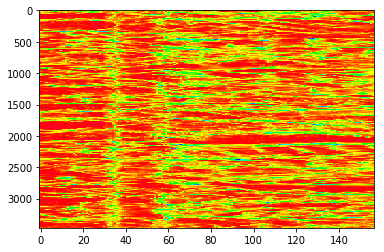

In [110]:
plt.imshow(ystuff.reshape((3465, 157)), aspect='auto', cmap="gist_rainbow")

In [104]:
withPredict = np.append(Y_train, predict3)

In [105]:
withPredict.shape

(544005,)

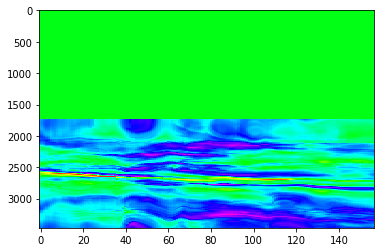

In [112]:
plt.imshow(withPredict.reshape((3465,157)),aspect='auto', cmap='gist_rainbow')

In [107]:
predict3_2 = clf3.predict(xstuff)

In [108]:
predict3_2.shape

(544005,)

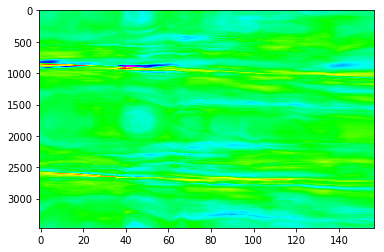

In [111]:
plt.imshow(predict3_2.reshape((3465,157)), aspect='auto', cmap="gist_rainbow")

In [114]:
clfk = KNeighborsClassifier(120)
clfSVC = SVC()

In [115]:
clfk.fit(X_train, Y_train)

ValueError: Unknown label type: 'continuous'

In [116]:
clf3.score(X_train, Y_train)

-6.720929096440135e+62

In [117]:
clfSVC.fit(X_train, Y_train)

ValueError: Unknown label type: 'continuous'

In [118]:
clf2.fit(X_train, Y_train)

LinearSVR(C=1.0, dual=True, epsilon=0.0, fit_intercept=True,
     intercept_scaling=1.0, loss='epsilon_insensitive', max_iter=1000,
     random_state=None, tol=0.0001, verbose=0)

In [119]:
clf2.score(X_train, Y_train)

-2.130803358463373

In [120]:
clf2.predict(X_test)

array([0., 0., 0., ..., 0., 0., 0.])

In [125]:
inte = kmo.new_inte1[5][:,0:100,:]

In [126]:
inte.shape

(3465, 100, 1280)

In [133]:
Y_train2 = np.reshape(inte, (346500, 1280))

In [221]:
X_train2 = np.reshape(np.transpose( tg[:, :, :, 0:100],(0,1,3,2)),(3465*100,1554))

In [222]:
print(X_train2.shape)
print(Y_train2.shape)

(346500, 1554)
(346500, 1280)


In [135]:
clf3.fit(X_train2, Y_train2)

/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDRegressor'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


ValueError: bad input shape (346500, 1280)

In [142]:
RandomForestRegressor?

In [143]:
rf = RandomForestRegressor(n_estimators=200, oob_score=True)

In [144]:
rf.fit(Y_train2[0:173250, :], X_train2[0:173250, 500:600])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
           oob_score=True, random_state=None, verbose=0, warm_start=False)

In [170]:
predictRF = rf.predict(Y_train2[173250:, :])

KeyboardInterrupt: 

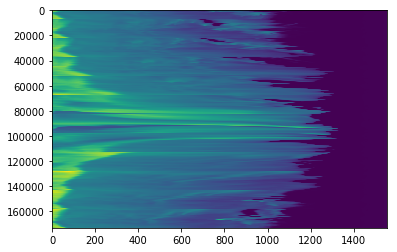

In [149]:
plt.imshow(X_train2[173250:, :], aspect='auto')

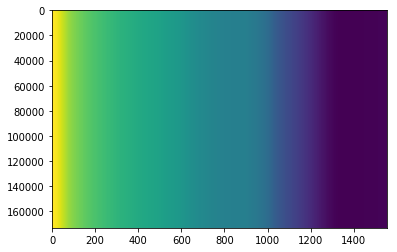

In [150]:
plt.imshow(predictRF, aspect='auto')

In [151]:
predictallRF = rf.predict(Y_train2)

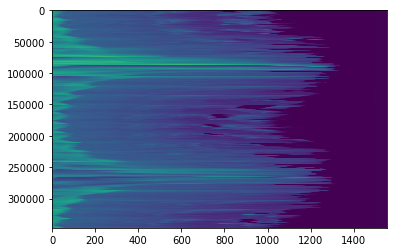

In [152]:
plt.imshow(X_train2, aspect='auto')

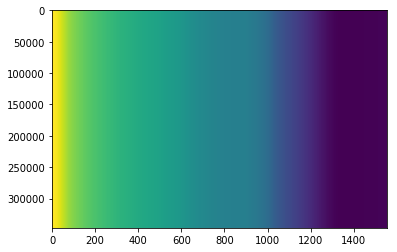

In [153]:
plt.imshow(predictallRF, aspect='auto')

In [156]:
rf500 = RandomForestRegressor(n_estimators=500, oob_score=True)

In [157]:
rf500.fit(Y_train2[0:173250, :], X_train2[0:173250, :])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=1,
           oob_score=True, random_state=None, verbose=0, warm_start=False)

In [159]:
predictrf500 = rf500.predict(Y_train2[173250:, :])

In [160]:
predictallrf500 = rf500.predict(Y_train2)

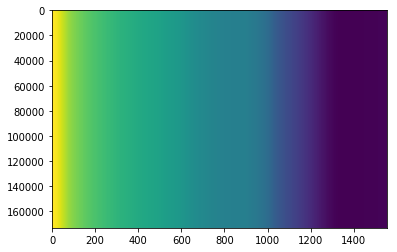

In [161]:
plt.imshow(predictrf500, aspect='auto')

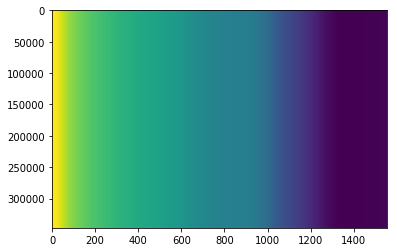

In [162]:
plt.imshow(predictallrf500, aspect='auto')

In [163]:
rf.score(Y_train2[173250:, :], X_train2[173250:, :])

-0.11519338360599665

In [164]:
rf500.score(Y_train2[173250:, :], X_train2[173250:, :])

-0.11509683070667469

In [168]:
rf.score(Y_train2[173250:, :], predictrf500)

-550891655710794.06

In [174]:
rf10 = RandomForestRegressor(n_estimators=10, oob_score=True)

In [196]:
rf10.fit(Y_train2[0:173250, :], X_train2[0:173250, 500:600])

/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:724: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=True, random_state=None, verbose=0, warm_start=False)

In [197]:
predictrf10 = rf10.predict(Y_train2[173250:, :])

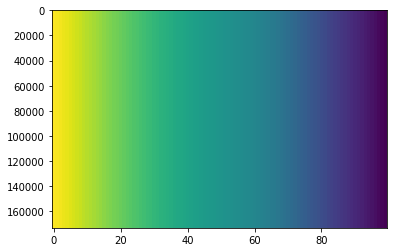

In [198]:
plt.imshow(predictrf10, aspect='auto')

In [180]:
rf10back = RandomForestRegressor(n_estimators=10, oob_score=True)

In [181]:
rf10back.fit(X_train2[0:173250, :], Y_train2[0:173250, :])

/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:724: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=True, random_state=None, verbose=0, warm_start=False)

In [188]:
predictrf10back = rf10back.predict(X_train2[:173250, :])

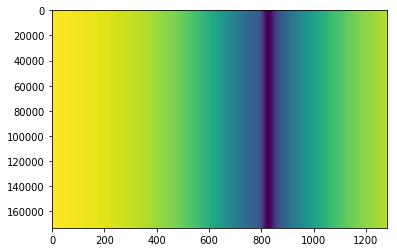

In [189]:
plt.imshow(predictrf10back, aspect='auto')

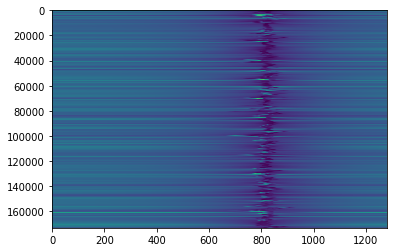

In [190]:
plt.imshow(Y_train2[:173250, :], aspect='auto')

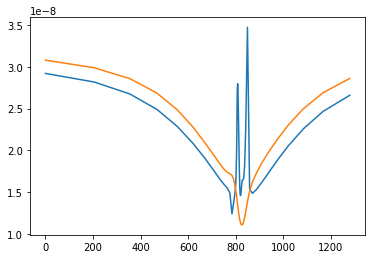

In [194]:
k=1660; plt.plot(Y_train2[k,:]); plt.plot(predictrf10back[k,:]); plt.show()



In [195]:
print(X_train2[0:173250, :].shape, Y_train2[0:173250, :].shape)



(173250, 1554) (173250, 1280)


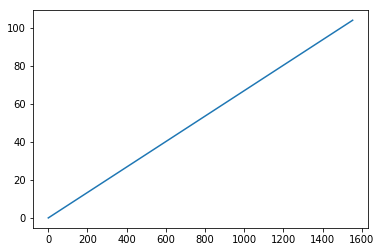

In [200]:
plt.plot(dd.z)

(get_var): reading  tg
(get_var): setsnap  300 -1
(get_var): reading simple  (6930, 1, 1554)


(array([   0,    1,    2, ..., 1240, 1241, 1242]),)

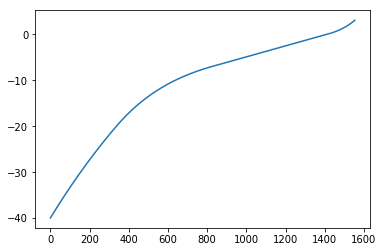

In [207]:
ee=br.BifrostData('l2d90x40r_it',fdir='/net/opal/Volumes/Amnesia/mpi3drun/2Druns/genohm/rain/l2d90x40r/') 
tgsinglesnap=ee.get_var('tg',300)
plt.plot(ee.z)
np.where(-ee.z >2.0)

In [203]:
ee.dz1d

array([0.06694, 0.06694, 0.06694, ..., 0.06694, 0.06694, 0.06694])

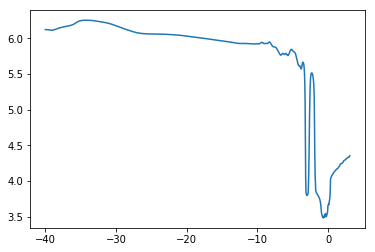

In [208]:
plt.plot(ee.z,np.log10(tgsinglesnap[1000,0,:]))

In [295]:
iztop = np.min(np.where(tgsinglesnap[1000,0,:] < 2e5))
izbottom = np.max(np.where(ee.z < 0.3))

In [296]:
print(ee.z[izbottom])
print(ee.z[iztop])
print(izbottom)
print(iztop)

0.286833
-3.262031
1433
1137


In [216]:
tg.shape

(3465, 1, 1554, 157)

In [217]:
tg?

In [218]:
tgsinglesnap.shape

(6930, 1, 1554)

In [224]:
tg[100, 0, :, 0].shape

(1554,)

In [225]:
tgsinglesnap[1000, 0, :].shape

(1554,)

In [226]:
tg_new = np.reshape(np.transpose(tg,(0,1,2,3)),(3465,1554, 157))

In [227]:
tg_new.shape

(3465, 1554, 157)

In [248]:
iztop = sys.maxsize
izbottom = -sys.maxsize-1

for i in range(157):
    for j in range(3465):
        bottom = np.max(np.where(dd.z < 0.3))
        top = np.min(np.where(tg_new[j,:,i] < 2e5))
        if(bottom > izbottom):
            izbottom = bottom
        if(top < iztop):
            iztop = top

tg_newvals = tg_new[:, iztop:izbottom, 0:100]

In [241]:
print(iztop, izbottom)

670 1433


In [242]:
print(tg_newvals.shape)

(3465, 0, 157)


In [243]:
tg_new.shape

(3465, 1554, 157)

In [249]:
tg_newvals.shape

(3465, 763, 100)

In [251]:
X_train3 = np.reshape(np.transpose(tg_newvals,(0,2,1)),(3465*100,763))

In [252]:
X_train3.shape

(346500, 763)

In [253]:
Y_train2.shape

(346500, 1280)

In [312]:
np.save("X_train3", X_train3)
np.save("Y_train2", Y_train2)

In [255]:
rf10_small = RandomForestRegressor(n_estimators=10)

In [258]:
rf10_small.fit(X_train3[0:173250,:], Y_train2[0:173250, :])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [259]:
predict_rf10_small = rf10_small.predict(X_train3[173250:, :])

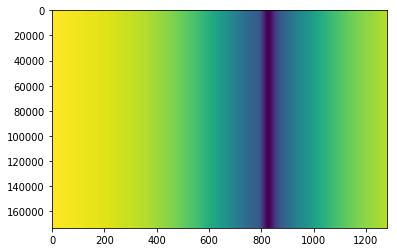

In [261]:
plt.imshow(predict_rf10_small, aspect='auto')

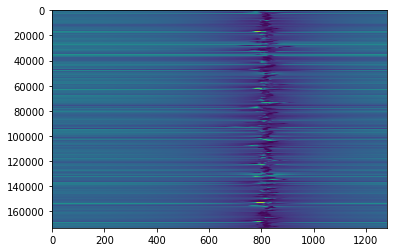

In [262]:
plt.imshow(Y_train2[173250:, :], aspect='auto')

In [278]:
tg_newvals2 = tg_new[:, 0:10, 0:100]

In [279]:
randomrf10 = RandomForestRegressor(n_estimators=10)

In [265]:
tg_newvals2.shape

(3465, 300, 100)

In [282]:
X_train4 = np.reshape(np.transpose(tg_newvals2,(0,2,1)),(3465*100,10))

In [292]:
randomrf10.fit(X_train4[0:173250, :], Y_train2[0:173250, :])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [293]:
predict_random_rf10 = randomrf10.predict(X_train4[173250:, :])

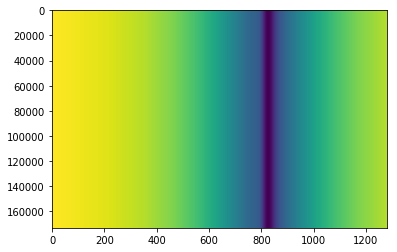

In [294]:
plt.imshow(predict_random_rf10, aspect='auto')

In [297]:
X_train4.shape

(346500, 10)

In [298]:
randomrf10.fit(Y_train2[0:173250, :], X_train4[0:173250, :])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [299]:
predict_random_rf10_2 = randomrf10.predict(Y_train2[173250:, :])

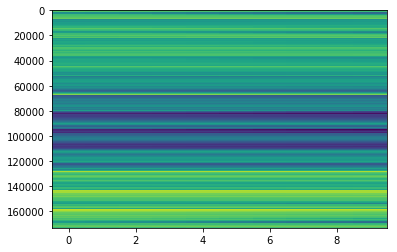

In [300]:
plt.imshow(X_train4[173250:, :], aspect='auto')

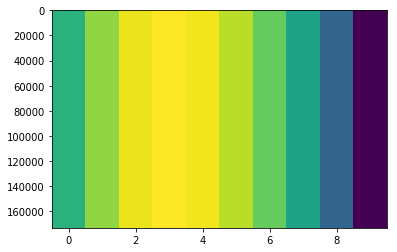

In [302]:
plt.imshow(predict_random_rf10_2, aspect='auto')

In [303]:
rf10_small.fit(Y_train2[0:173250, :], X_train3[0:173250,:])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [304]:
predict_small_2 = rf10_small.predict(Y_train2[173250:, :])

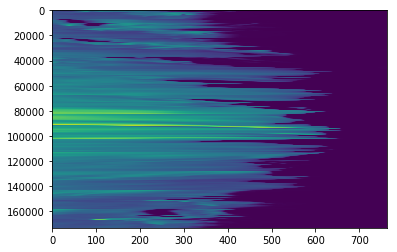

In [305]:
plt.imshow(X_train3[173250:, :], aspect='auto')

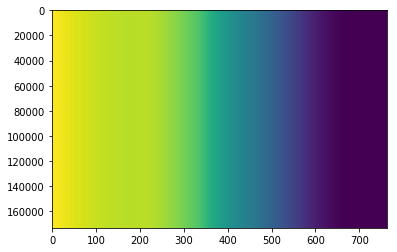

In [306]:
plt.imshow(predict_small_2, aspect='auto')

In [308]:
predict_small_same = rf10_small.predict(Y_train2[0:173250, :])

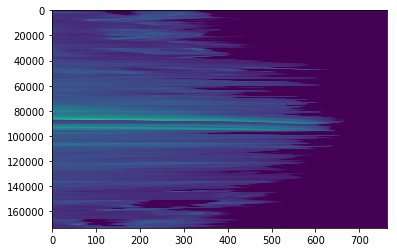

In [309]:
plt.imshow(X_train3[0:173250, :], aspect='auto')

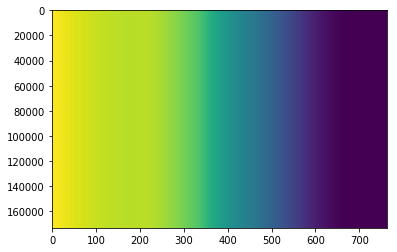

In [310]:
plt.imshow(predict_small_same, aspect='auto')

In [38]:
pca = PCA(0.9999)

In [317]:
X_train3.shape

(346500, 763)

In [316]:
Y_train2.shape

(346500, 1280)

In [8]:
#shuffle

In [139]:
x = np.load('X_train3.npy')[0:100000, :]
y = np.load('Y_train2.npy')[0:100000, :]

In [10]:
x.shape

(346500, 763)

In [11]:
y.shape

(346500, 1280)

In [16]:
shuffle_x = np.arange(x.shape[0])
np.random.shuffle(shuffle_x)

In [17]:
shuffle_x.shape

(346500,)

In [18]:
x_sh = x.copy()
x_sh = x_sh[shuffle_x]

In [19]:
y_sh = y.copy()
y_sh = y_sh[shuffle_x]

In [20]:
y_sh.shape

(346500, 1280)

In [21]:
x_sh.shape

(346500, 763)

In [23]:
pca.fit(x_sh)

PCA(copy=True, iterated_power='auto', n_components=30, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [44]:
X_train, X_test, y_train, y_test = train_test_split(x_sh, y_sh, test_size=0.2, shuffle=False)

In [45]:
X_train.shape

(277200, 763)

In [46]:
y_train.shape

(277200, 1280)

In [47]:
X_test.shape

(69300, 763)

In [48]:
y_test.shape

(69300, 1280)

In [66]:
pca.fit(y_sh_scale)

PCA(copy=True, iterated_power='auto', n_components=0.9999, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [67]:
print(pca.n_components_)

29


In [68]:
y_sh_scale_transform = pca.transform(y_sh_scale)

In [69]:
y_sh_transform.shape

(346500, 30)

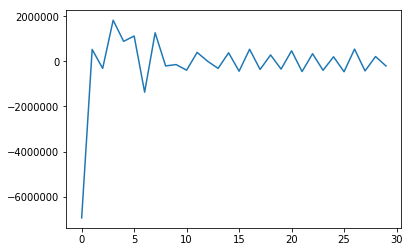

In [37]:
plt.plot(x_sh_transform[0, :])

In [53]:
x_scaler = MinMaxScaler()
y_scaler = MinMaxScaler()

In [54]:
x_scaler.fit(x_sh)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [55]:
y_scaler.fit(y_sh)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [57]:
x_sh_scale = x_scaler.transform(x_sh)

In [58]:
y_sh_scale = y_scaler.transform(y_sh)

In [70]:
X_train, X_test, y_train, y_test = train_test_split(x_sh_scale, y_sh_scale_transform, test_size=0.2, shuffle=False)

In [60]:
X_train.shape

(277200, 763)

In [63]:
y_train.shape

(277200, 1280)

In [64]:
rgr = RandomForestRegressor(n_estimators=10)

In [71]:
rgr.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [72]:
y_pred = rgr.predict(X_test)

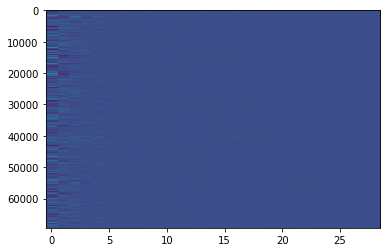

In [73]:
plt.imshow(y_pred, aspect='auto')

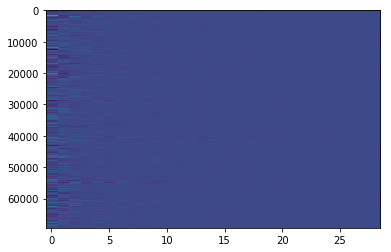

In [74]:
plt.imshow(y_test, aspect='auto')

In [75]:
y_pred.shape

(69300, 29)

In [76]:
y_pred_inv = pca.inverse_transform(y_pred)
y_test_inv = pca.inverse_transform(y_test)

In [77]:
y_pred_inv.shape

(69300, 1280)

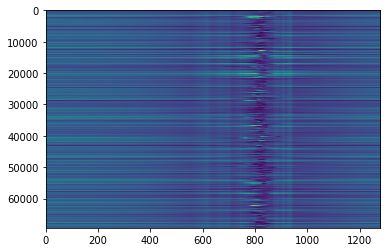

In [78]:
plt.imshow(y_pred_inv, aspect='auto')

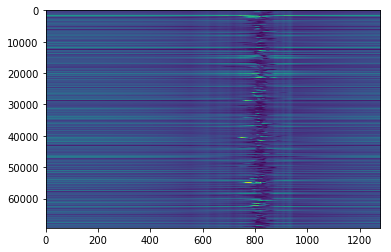

In [79]:
plt.imshow(y_test_inv, aspect='auto')

In [81]:
#Vars for Input/Output
X_train_scale = x_sh_scale[0:9000, :]
y_train_scale = y_sh_scale[0:9000, :]
X_test_scale = x_sh_scale[9000:11000, :]
y_test_scale = x_sh_scale[9000:11000, :]
#above shud be y not rerunning tho

X_train_noscl = x_sh[0:9000, :]
X_test_noscl = x_sh[9000:11000, :]

pca2 = PCA(0.9999)
pca2.fit(y_sh)
y_noscl_pca = pca2.transform(y_sh)
y_train_noscl_pca = y_noscl_pca[0:9000, :]
y_test_noscl_pca = y_noscl_pca[9000:11000, :]

In [82]:
#Scl/Scl
rgr_ss = RandomForestRegressor(n_estimators=10, n_jobs=-1)
rgr_ss.fit(X_train_scale, y_train_scale*1e-7)
ss_pred = rgr_ss.predict(X_test_scale)

#NoScl/Scl
rgr_ns = RandomForestRegressor(n_estimators=10, n_jobs=-1)
rgr_ns.fit(X_train_noscl, y_train_scale)
ns_pred = rgr_ns.predict(X_test_noscl)

#NoScl/NoSclPca
rgr_nnp = RandomForestRegressor(n_estimators=10, n_jobs=-1)
rgr_nnp.fit(X_train_noscl, y_train_noscl_pca*1e7)
nnp_pred = rgr_nnp.predict(X_test_noscl)

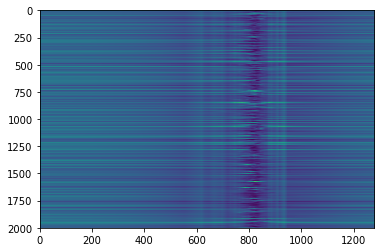

In [126]:
#scl/scl
plt.imshow(ss_pred, aspect='auto')

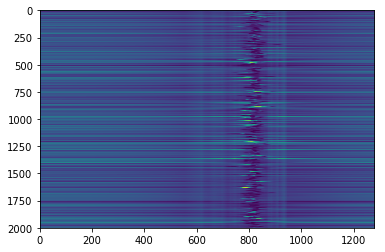

In [86]:
plt.imshow(y_sh_scale[9000:11000, :], aspect='auto')

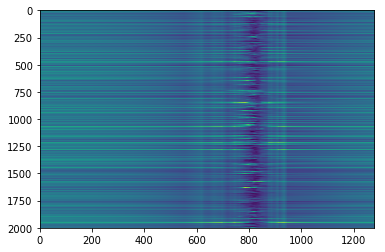

In [87]:
#noscl/scl
plt.imshow(ns_pred, aspect='auto')

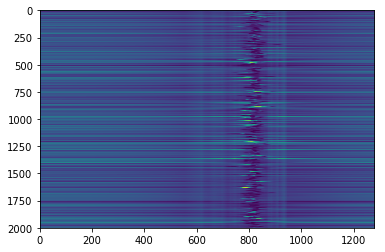

In [88]:
plt.imshow(y_sh_scale[9000:11000, :], aspect='auto')

In [154]:
#noscl/nosclpca
nnp_pred_transform = pca2.inverse_transform(nnp_pred)

In [94]:
nnp_pred_transform.shape

(2000, 1280)

In [116]:
nnp_pred.shape

(2000, 30)

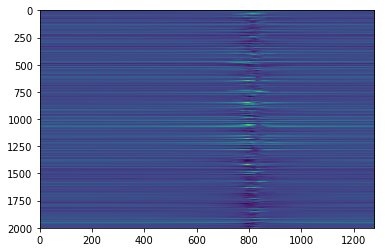

In [155]:
plt.imshow(nnp_pred_transform, aspect='auto')

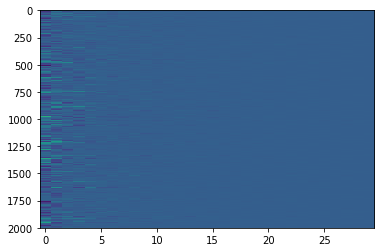

In [99]:
plt.imshow(y_test_noscl_pca, aspect='auto')

In [107]:
y_train_noscl_pca.min()

-3.589425160604532e-07

In [108]:
y_train_noscl_pca.max()

9.558897495946944e-07

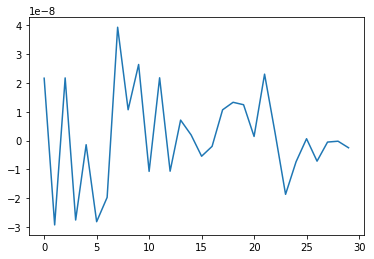

In [109]:
plt.plot(y_train_noscl_pca[100, :])

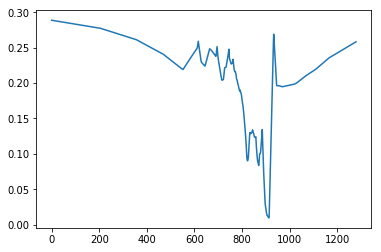

In [110]:
plt.plot(y_train_scale[100, :])

In [137]:
rgr_nnp = RandomForestRegressor(n_estimators=10, n_jobs=-1)
rgr_nnp.fit(X_train_noscl, y_train_noscl_pca*1e5)
nnp_pred = rgr_nnp.predict(X_test_noscl)

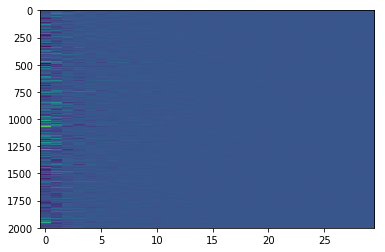

In [138]:
plt.imshow(nnp_pred, aspect='auto')

In [123]:
rgr_ss = RandomForestRegressor(n_estimators=10, n_jobs=-1)
rgr_ss.fit(X_train_scale, y_train_scale)
ss_pred = rgr_ss.predict(X_test_scale)

In [140]:
x.shape

(100000, 763)

In [141]:
y.shape

(100000, 1280)

In [142]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=False)

In [143]:
X_train.shape

(80000, 763)

In [145]:
y_train.shape

(80000, 1280)

In [150]:
shuffle = np.arange(X_train.shape[0])
np.random.shuffle(shuffle)

In [151]:
X_train_sh = X_train[shuffle]

In [152]:
X_train_sh.shape

(80000, 763)

In [156]:
y_train_sh = y_train[shuffle]

In [157]:
y_train_sh.shape

(80000, 1280)

In [158]:
pca3 = PCA(0.9999)

In [159]:
pca3.fit(y_train_sh)

PCA(copy=True, iterated_power='auto', n_components=0.9999, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [160]:
pca3.n_components_

30

In [162]:
y_train_sh_pca = pca3.transform(y_train_sh)

In [163]:
y_train_sh_pca.shape

(80000, 30)

In [166]:
print(y_train_sh_pca.min())
print(y_train_sh_pca.max())

-3.856426206465088e-07
1.35131066788153e-06


In [210]:
rgr_split = RandomForestRegressor(n_estimators=10, n_jobs=-1)
rgr_split.fit(X_train_sh, y_train_sh_pca*1e6)
split_pred = rgr_split.predict(X_test)*1e-6

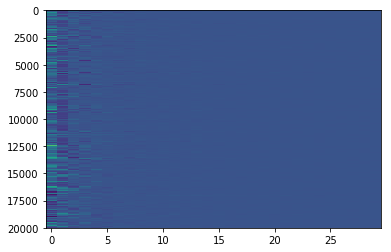

In [211]:
plt.imshow(split_pred, aspect='auto')

In [212]:
split_pred.shape

(20000, 30)

In [213]:
split_pred_transform = pca3.inverse_transform(split_pred)

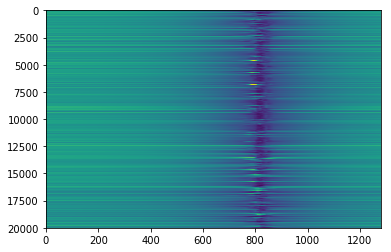

In [214]:
plt.imshow(split_pred_transform, aspect='auto')

In [176]:
split_pred_transform.shape

(20000, 1280)

In [188]:
full_im = np.zeros((100000, 1280))

In [180]:
full_im.shape

(100000, 1280)

In [192]:
for i in range(80000):
    full_im[i] = y_train[i, :]

In [215]:
full_im = np.concatenate((y_train, split_pred_transform), axis=0)

In [216]:
full_im.shape

(100000, 1280)

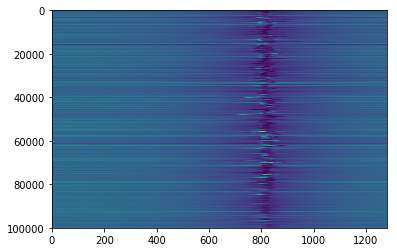

In [217]:
plt.imshow(full_im, aspect='auto')

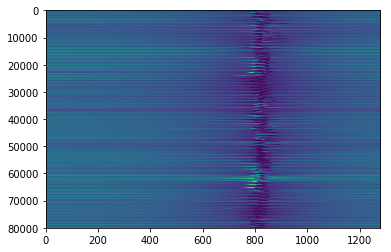

In [185]:
plt.imshow(y_train, aspect='auto')

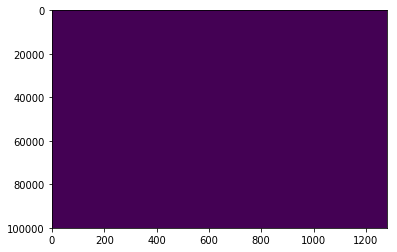

In [189]:
plt.imshow(full_im, aspect='auto')

In [205]:
full_im[0]

array([3.06231946e-08, 3.06181713e-08, 3.06131480e-08, ...,
       2.80677936e-08, 2.80850366e-08, 2.81022796e-08])

In [206]:
y_train[0]

array([3.06231946e-08, 3.06181713e-08, 3.06131480e-08, ...,
       2.80677936e-08, 2.80850366e-08, 2.81022796e-08])

In [207]:
full_im[1]

array([3.00661291e-08, 3.00612263e-08, 3.00563235e-08, ...,
       2.75462813e-08, 2.75633310e-08, 2.75803806e-08])

In [208]:
y_train[1]

array([3.00661291e-08, 3.00612263e-08, 3.00563235e-08, ...,
       2.75462813e-08, 2.75633310e-08, 2.75803806e-08])

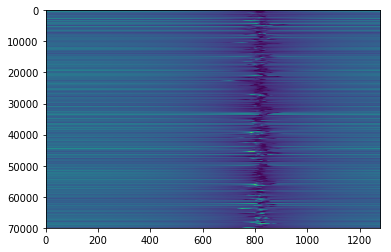

In [209]:
plt.imshow(full_im[0:70000, :], aspect='auto')

In [333]:
x_scaler2 = MinMaxScaler()
y_scaler2 = MinMaxScaler()

x_scaler2.fit(X_train_sh)
y_scaler2.fit(y_train_sh)

x_scale_train = x_scaler2.transform(X_train_sh)
y_scale_train = y_scaler2.transform(y_train_sh)


x_scale_test = x_scaler2.transform(X_test)
y_scale_test = y_scaler2.transform(y_test)

In [248]:
X_test.shape

(20000, 763)

In [249]:
pca4 = PCA(0.9999)
pca4.fit(y_scale_train)
y_scale_train_pca = pca4.transform(y_scale_train)

In [340]:
rgr_ssp = RandomForestRegressor(n_estimators=100, n_jobs=-1)
rgr_ssp.fit(x_scale_train, y_scale_train_pca)                                                                                              
ssp_pred = rgr_ssp.predict(x_scale_test)

In [341]:
ssp_pred.shape

(20000, 29)

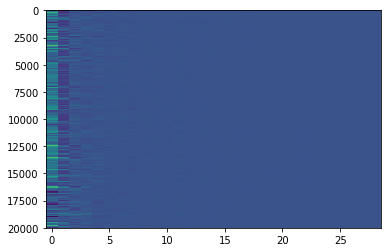

In [342]:
plt.imshow(ssp_pred, aspect='auto')

In [343]:
ssp_pred_transform = pca4.inverse_transform(ssp_pred)

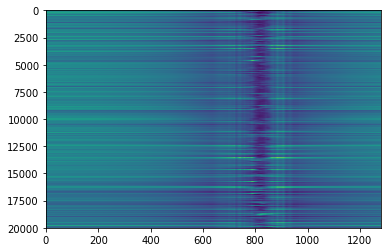

In [344]:
plt.imshow(ssp_pred_transform, aspect='auto')

In [345]:
x_scale_train.shape

(80000, 763)

In [346]:
full_ss2 = np.concatenate((y_train, ssp_pred_inv), axis=0)

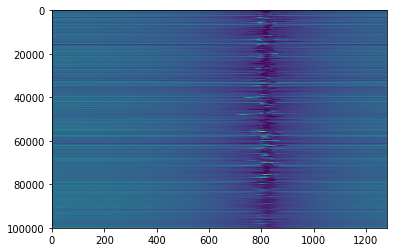

In [347]:
plt.imshow(full_ss2, aspect='auto')

In [348]:
y_train[0,0]

3.062319464675056e-08

In [349]:
ssp_pred_transform[0,0]

0.39235460547252055

In [350]:
ssp_pred_inv = y_scaler2.inverse_transform(ssp_pred_transform)

In [351]:
ssp_pred_inv.shape

(20000, 1280)

In [352]:
ssp_pred_inv[0, 0]

3.62669781352068e-08

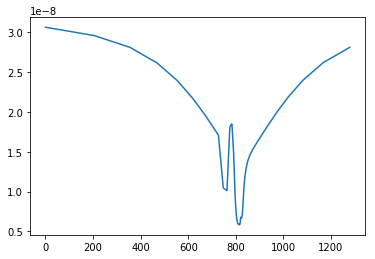

In [353]:
plt.plot(full_ss2[0, :])

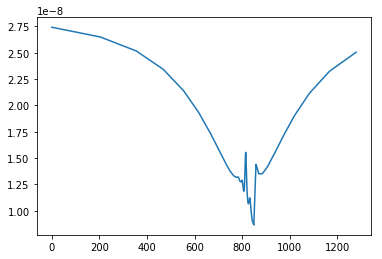

In [354]:
plt.plot(full_ss2[50, :])

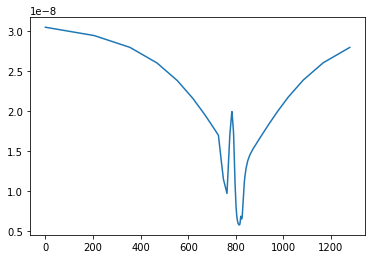

In [355]:
plt.plot(full_ss2[100, :])

In [356]:
np.min(full_ss2[100, :])

5.740941096004449e-09

In [357]:
np.argmin(full_ss2[100, :])

815

In [358]:
full_ss2[100, 815]

5.740941096004449e-09

In [359]:
min_indexes = np.zeros(100000)

In [360]:
for i in range(100000):
    min_indexes[i] = np.argmin(full_ss2[i, :])

In [361]:
min_indexes

array([816., 809., 813., ..., 824., 818., 820.])

In [362]:
np.min(min_indexes)

552.0

In [363]:
np.max(min_indexes)

1166.0

In [364]:
np.mean(min_indexes)

822.39411

In [365]:
pred_spectra = np.zeros(100000)

In [366]:
pred_spectra= np.sum(full_ss2[:, 780:840], axis=1)

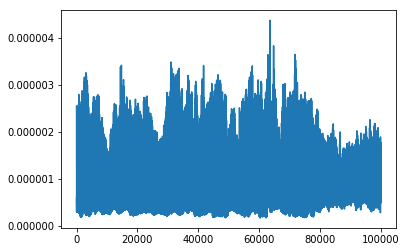

In [367]:
plt.plot(pred_spectra)

In [368]:
original_spectra = np.sum(y[:, 780:840], axis=1)

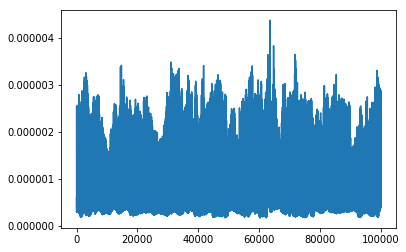

In [369]:
plt.plot(original_spectra)

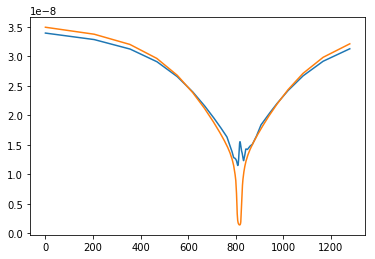

In [376]:
plt.plot(full_ss2[85000, :])
plt.plot(y[85000, :])

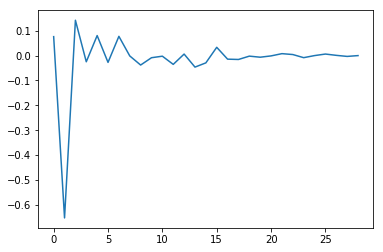

In [371]:
plt.plot(ssp_pred[10000, :])

In [372]:
rgr_ssp.score(x_scale_train, y_scale_train_pca)

0.9887412632524003

In [375]:
rgr_ssp.score(x_scale_test, y_scale_test_pca)

0.13803765222170178

In [317]:
RandomForestRegressor?

In [334]:
pca_score = PCA(29)

In [335]:
#pca4.fit(y_scale_test)

PCA(copy=True, iterated_power='auto', n_components=29, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [374]:
y_scale_test_pca = pca4.transform(y_scale_test)